# <html>

   

<div style="background-image: linear-gradient(to left, rgb(255, 255, 255), rgb(138, 136, 136)); width: auto; margin: 10px;">

  <img src="https://upload.wikimedia.org/wikipedia/en/thumb/f/fd/University_of_Tehran_logo.svg/225px-University_of_Tehran_logo.svg.png" width=100px width=auto style="padding:10px; vertical-align: center;">



</div>

   

<div   style:"text-align: center; background-image: linear-gradient(to left, rgb(255, 255, 255), rgb( 219, 204, 245  ));width: 400px; height: 30px; ">

<h1 style="font-family: Georgia; color: black; text-align: center; ">Course: NNDL </h1>



</div>

<div   style:"border: 3px solid green;text-align: center; ">

<h1 style="font-family: Georgia; color: black; text-align: center; ">Project2 - Question2 </h1>



</div>



   <div>    

<h1 style="font-family: Georgia; color: black; text-align: center; font-size:15px;">Mohammad Amanlou- sid:810100084 </h1>





</div>

   



</html>

In [1]:
import os

import matplotlib.pyplot as plt

from PIL import Image

from sklearn.model_selection import train_test_split

import torch

import timm

import torchvision.transforms as transforms

from torchvision import datasets, models

from torch.utils.data import DataLoader, Dataset

import torch.nn as nn

import torch.optim as optim

import numpy as np

from albumentations import (

    Resize, Normalize, HorizontalFlip, VerticalFlip, RandomBrightnessContrast, ShiftScaleRotate, Compose

)

from albumentations.pytorch import ToTensorV2

from torch.optim.lr_scheduler import ReduceLROnPlateau

import copy

import pandas as pd



# Kaggle dataset download

import kagglehub

path = kagglehub.dataset_download("prakharrastogi534/bean-leaf-dataset")

print("Path to dataset files:", path)

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Path to dataset files: /kaggle/input/bean-leaf-dataset


In [2]:
# Define data directories

train_dir = os.path.join(path, 'train/train')

val_dir = os.path.join(path, 'validation/validation')

test_dir = os.path.join(path, 'test/test')



# Load the dataset

full_dataset = datasets.ImageFolder(root=train_dir)

In [3]:
# Split dataset into train, validation, and test sets with ratio 80-10-10

dataset_size = len(full_dataset)

train_size = int(0.8 * dataset_size)

val_size = int(0.1 * dataset_size)

test_size = dataset_size - train_size - val_size

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size, test_size])

In [4]:
mean = [0.485, 0.456, 0.406]

std = [0.229, 0.224, 0.225]



# Define augmentation transforms used in the paper

transform = Compose([

    Resize(224, 224),

    HorizontalFlip(p=0.5),

    VerticalFlip(p=0.2),

    ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),

    RandomBrightnessContrast(p=0.2),

    Normalize(mean=mean, std=std),

    ToTensorV2()

])

In [5]:
# Custom dataset for applying the transforms

class CustomBeanLeafDataset(Dataset):

    def __init__(self, dataset, transform=None):

        self.dataset = dataset

        self.transform = transform



    def __len__(self):

        return len(self.dataset)



    def __getitem__(self, idx):

        image, label = self.dataset[idx]

        image = np.array(image)

        if self.transform:

            transformed = self.transform(image=image)

            image = transformed['image']

        return image, label


In [6]:
# Create transformed datasets

train_transformed = CustomBeanLeafDataset(train_dataset, transform=transform)

val_transformed = CustomBeanLeafDataset(val_dataset, transform=transform)

test_transformed = CustomBeanLeafDataset(test_dataset, transform=transform)

In [7]:
# Data loaders

train_loader = DataLoader(train_transformed, batch_size=16, shuffle=True)

val_loader = DataLoader(val_transformed, batch_size=16, shuffle=False)

test_loader = DataLoader(test_transformed, batch_size=16, shuffle=False)

print("Data preparation completed!")

Data preparation completed!


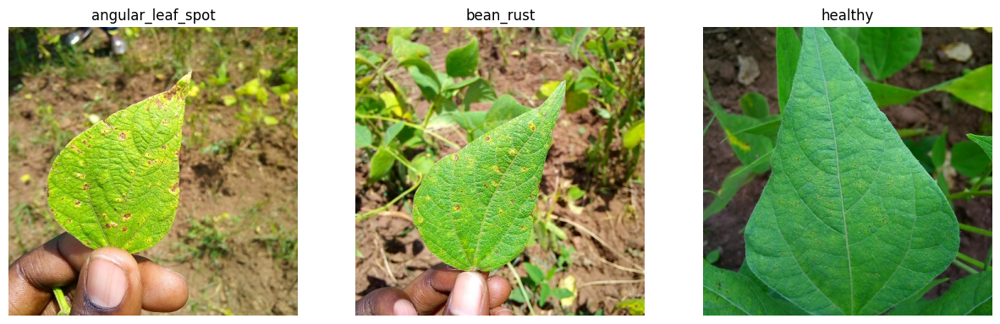

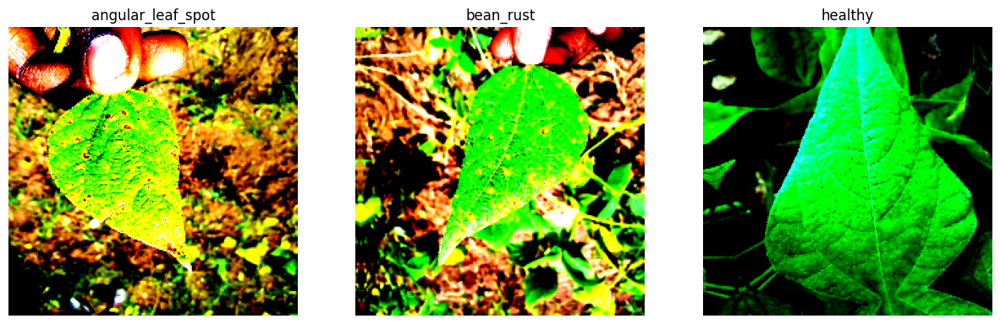

In [21]:
# Display a sample of images with labels

import warnings

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, (img, label) in enumerate([train_dataset[0], val_dataset[0], test_dataset[0]]):

    img = np.array(img)

    axes[i].imshow(img)

    axes[i].set_title(full_dataset.classes[label])

    axes[i].axis('off')

plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

warnings.filterwarnings("ignore", category=UserWarning, module='matplotlib.image')

for i, (img, label) in enumerate([train_transformed[0], val_transformed[0], test_transformed[0]]):

    img = img.numpy()

    img = np.transpose(img, (1, 2, 0))

    axes[i].imshow(img)

    axes[i].set_title(full_dataset.classes[label])

    axes[i].axis('off')



plt.show()

In [9]:
# Load pre-trained models and modify them for transfer learning

models_dict = {

    "EfficientNetB6": models.efficientnet_b6(weights=models.EfficientNet_B6_Weights.IMAGENET1K_V1),

    "MobileNetV2": models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1),

    "NASNet": timm.create_model('nasnetalarge', pretrained=True)

}

Downloading: "https://download.pytorch.org/models/efficientnet_b6_lukemelas-24a108a5.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b6_lukemelas-24a108a5.pth
100%|██████████| 165M/165M [00:03<00:00, 48.0MB/s] 
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 143MB/s]


model.safetensors:   0%|          | 0.00/356M [00:00<?, ?B/s]

In [10]:
# Modify the models for 3-class classification

for model_name, model in models_dict.items():

    if model_name == "EfficientNetB6" or model_name == "MobileNetV2":

        in_features = model.classifier[1].in_features if hasattr(model.classifier, '__getitem__') else model.classifier.in_features

        model.classifier = nn.Sequential(

            nn.Dropout(0.3),

            nn.Linear(in_features, 3)

        )

    elif model_name == "NASNet":

        in_features = model.get_classifier().in_features

        model.classifier = nn.Sequential(

            nn.Dropout(0.3),

            nn.Linear(in_features, 3)

        )

    models_dict[model_name] = model.to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))

In [11]:
# Training configuration with Early Stopping

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=25, patience=5):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model.to(device)

    best_model_wts = model.state_dict()

    best_acc = 0.0

    epochs_no_improve = 0

    train_loss_history, val_loss_history, train_acc_history, val_acc_history = [], [], [], []



    for epoch in range(num_epochs):

        model.train()

        running_loss = 0.0

        running_corrects = 0

        for inputs, labels in train_loader:

            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)

            loss = criterion(outputs, labels)

            loss.backward()

            optimizer.step()

            _, preds = torch.max(outputs, 1)

            running_loss += loss.item() * inputs.size(0)

            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_loader.dataset)

        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_loss_history.append(epoch_loss)

        train_acc_history.append(epoch_acc.item())



        # Validation phase

        model.eval()

        val_loss = 0.0

        val_corrects = 0

        with torch.no_grad():

            for inputs, labels in val_loader:

                inputs, labels = inputs.to(device), labels.to(device)

                outputs = model(inputs)

                loss = criterion(outputs, labels)

                _, preds = torch.max(outputs, 1)

                val_loss += loss.item() * inputs.size(0)

                val_corrects += torch.sum(preds == labels.data)

        val_epoch_loss = val_loss / len(val_loader.dataset)

        val_epoch_acc = val_corrects.double() / len(val_loader.dataset)

        val_loss_history.append(val_epoch_loss)

        val_acc_history.append(val_epoch_acc.item())



        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, Val Loss: {val_epoch_loss:.4f}, Val Accuracy: {val_epoch_acc:.4f}')



        # Early stopping

        if val_epoch_acc > best_acc:

            best_acc = val_epoch_acc

            best_model_wts = model.state_dict()

            epochs_no_improve = 0

        else:

            epochs_no_improve += 1

            if epochs_no_improve == patience:

                print(f"Early stopping at epoch {epoch+1}")

                break



    # Load best model weights

    model.load_state_dict(best_model_wts)

    return model, train_loss_history, val_loss_history, train_acc_history, val_acc_history


In [12]:
# Evaluation and visualization after training

def evaluate_model(model, test_loader, criterion):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model.to(device)

    model.eval()

    test_loss = 0.0

    test_corrects = 0

    all_preds = []

    all_labels = []

    with torch.no_grad():

        for inputs, labels in test_loader:

            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)

            loss = criterion(outputs, labels)

            _, preds = torch.max(outputs, 1)

            test_loss += loss.item() * inputs.size(0)

            test_corrects += torch.sum(preds == labels.data)

            all_preds.extend(preds.cpu().numpy())

            all_labels.extend(labels.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    test_acc = test_corrects.double() / len(test_loader.dataset)

    print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')



    return all_preds, all_labels

In [13]:
# Define criterion and optimizers for each model and optimizer type

criterion = nn.CrossEntropyLoss()

optimizer_types = [optim.Adam, optim.RMSprop, optim.NAdam]

optimizer_names = ["Adam", "RMSprop", "Nadam"]

In [14]:
def train_and_evaluate(model_name, model, optimizer_type, train_loader, val_loader, test_loader, criterion):

    print(f"Training {model_name} with Augmented Data using {optimizer_type}...")

    optimizer = optimizer_type(model.parameters(), lr=0.001)

    trained_model, train_loss, val_loss, train_acc, val_acc = train_model(

        model, train_loader, val_loader, criterion, optimizer, num_epochs=25, patience=5

    )



    # Plot training and validation metrics

    epochs = range(1, len(train_loss) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)

    plt.plot(epochs, train_loss, 'r', label='Training Loss')

    plt.plot(epochs, val_loss, 'b', label='Validation Loss')

    plt.xlabel('Epochs')

    plt.ylabel('Loss')

    plt.title(f'{model_name} - {optimizer_type.__name__} Loss')

    plt.legend()



    plt.subplot(1, 2, 2)

    plt.plot(epochs, train_acc, 'r', label='Training Accuracy')

    plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')

    plt.xlabel('Epochs')

    plt.ylabel('Accuracy')

    plt.title(f'{model_name} - {optimizer_type.__name__} Accuracy')

    plt.legend()



    plt.tight_layout()

    plt.show()



    # Evaluate model on test data

    all_preds, all_labels = evaluate_model(trained_model, test_loader, criterion)



    # Display a few predictions with actual labels

    print("Displaying 5 sample predictions...")

    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    for i in range(5):

        img, label = test_transformed[i]

        img = img.permute(1, 2, 0).numpy()  # Convert from tensor to numpy

        img = (img * np.array(std)) + np.array(mean)  # Denormalize

        img = np.clip(img, 0, 1)

        pred_label = all_preds[i]

        true_label = all_labels[i]

        axes[i].imshow(img)

        axes[i].set_title(f'True: {full_dataset.classes[true_label]}, Pred: {full_dataset.classes[pred_label]}')

        axes[i].axis('off')

    plt.show()


Training with Optimizer: Adam
Training EfficientNetB6...
Training EfficientNetB6 with Augmented Data using <class 'torch.optim.adam.Adam'>...
Epoch 1/25, Train Loss: 0.4781, Train Accuracy: 0.8222, Val Loss: 6.4859, Val Accuracy: 0.7573
Epoch 2/25, Train Loss: 0.2707, Train Accuracy: 0.9093, Val Loss: 1.5054, Val Accuracy: 0.7670
Epoch 3/25, Train Loss: 0.2495, Train Accuracy: 0.9299, Val Loss: 2.4311, Val Accuracy: 0.8058
Epoch 4/25, Train Loss: 0.1862, Train Accuracy: 0.9287, Val Loss: 0.7229, Val Accuracy: 0.8738
Epoch 5/25, Train Loss: 0.1519, Train Accuracy: 0.9480, Val Loss: 2.9622, Val Accuracy: 0.6408
Epoch 6/25, Train Loss: 0.1692, Train Accuracy: 0.9371, Val Loss: 0.5827, Val Accuracy: 0.8350
Epoch 7/25, Train Loss: 0.1456, Train Accuracy: 0.9553, Val Loss: 2.2864, Val Accuracy: 0.8155
Epoch 8/25, Train Loss: 0.1246, Train Accuracy: 0.9661, Val Loss: 0.3863, Val Accuracy: 0.8738
Epoch 9/25, Train Loss: 0.1577, Train Accuracy: 0.9528, Val Loss: 0.3766, Val Accuracy: 0.9029
Ep

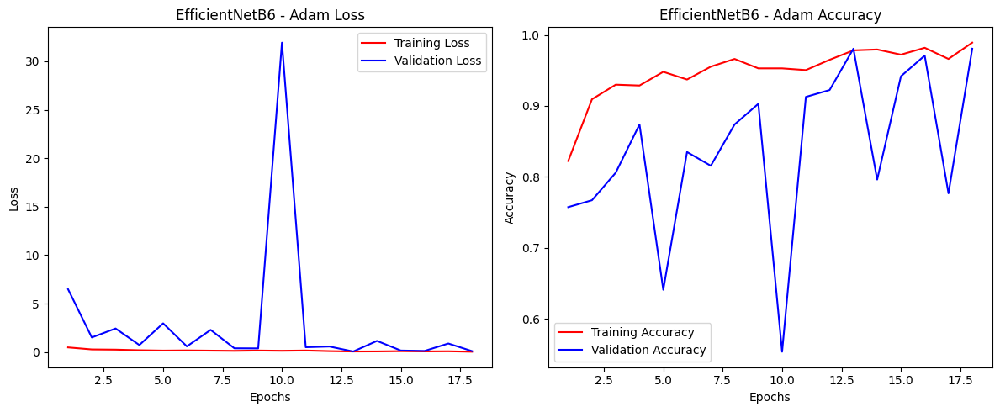

Test Loss: 0.1180, Test Accuracy: 0.9615
Displaying 5 sample predictions...


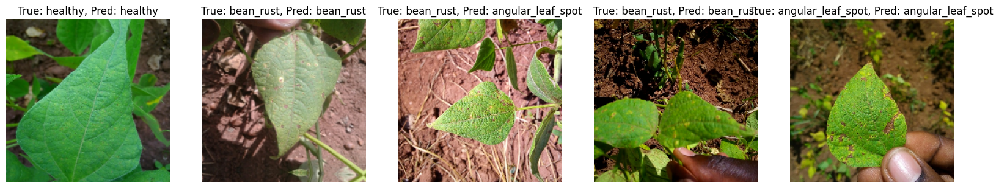

Training MobileNetV2...
Training MobileNetV2 with Augmented Data using <class 'torch.optim.adam.Adam'>...
Epoch 1/25, Train Loss: 0.5808, Train Accuracy: 0.7751, Val Loss: 0.3951, Val Accuracy: 0.8738
Epoch 2/25, Train Loss: 0.2755, Train Accuracy: 0.9057, Val Loss: 0.2786, Val Accuracy: 0.9029
Epoch 3/25, Train Loss: 0.1976, Train Accuracy: 0.9214, Val Loss: 0.2048, Val Accuracy: 0.8932
Epoch 4/25, Train Loss: 0.1638, Train Accuracy: 0.9420, Val Loss: 0.1920, Val Accuracy: 0.9515
Epoch 5/25, Train Loss: 0.2284, Train Accuracy: 0.9287, Val Loss: 0.2431, Val Accuracy: 0.8932
Epoch 6/25, Train Loss: 0.1558, Train Accuracy: 0.9468, Val Loss: 0.1809, Val Accuracy: 0.9612
Epoch 7/25, Train Loss: 0.1352, Train Accuracy: 0.9577, Val Loss: 0.2633, Val Accuracy: 0.9320
Epoch 8/25, Train Loss: 0.1675, Train Accuracy: 0.9432, Val Loss: 0.1093, Val Accuracy: 0.9709
Epoch 9/25, Train Loss: 0.1550, Train Accuracy: 0.9492, Val Loss: 0.2611, Val Accuracy: 0.9223
Epoch 10/25, Train Loss: 0.2152, Train 

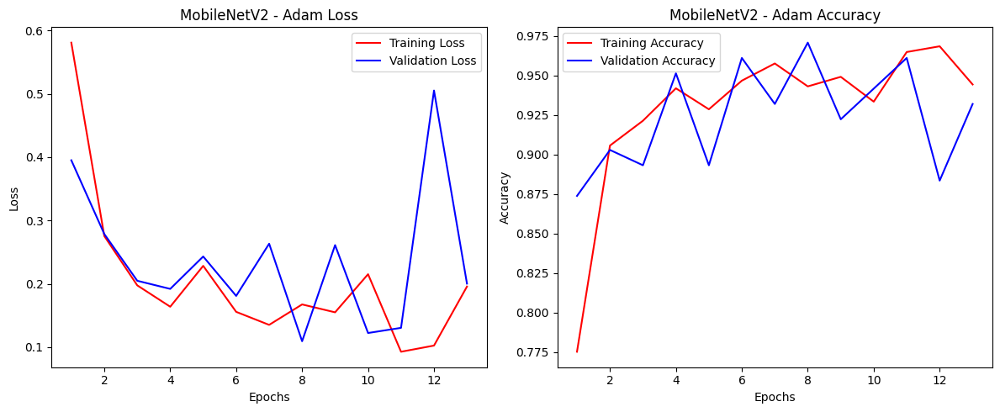

Test Loss: 0.1739, Test Accuracy: 0.9423
Displaying 5 sample predictions...


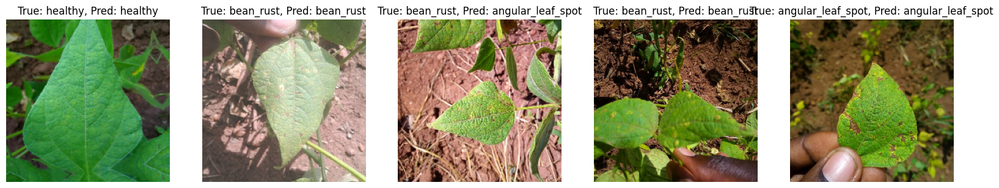

Training NASNet...
Training NASNet with Augmented Data using <class 'torch.optim.adam.Adam'>...
Epoch 1/25, Train Loss: 1.0802, Train Accuracy: 0.7231, Val Loss: 0.8933, Val Accuracy: 0.7864
Epoch 2/25, Train Loss: 0.3808, Train Accuracy: 0.8730, Val Loss: 0.2853, Val Accuracy: 0.9223
Epoch 3/25, Train Loss: 0.2480, Train Accuracy: 0.9093, Val Loss: 0.6207, Val Accuracy: 0.7379
Epoch 4/25, Train Loss: 0.2748, Train Accuracy: 0.9166, Val Loss: 0.3726, Val Accuracy: 0.9320
Epoch 5/25, Train Loss: 0.2367, Train Accuracy: 0.9274, Val Loss: 0.1979, Val Accuracy: 0.9320
Epoch 6/25, Train Loss: 0.2041, Train Accuracy: 0.9311, Val Loss: 0.2878, Val Accuracy: 0.9320
Epoch 7/25, Train Loss: 0.1849, Train Accuracy: 0.9432, Val Loss: 0.2541, Val Accuracy: 0.9126
Epoch 8/25, Train Loss: 0.1425, Train Accuracy: 0.9577, Val Loss: 0.3467, Val Accuracy: 0.8932
Epoch 9/25, Train Loss: 0.1948, Train Accuracy: 0.9250, Val Loss: 0.3055, Val Accuracy: 0.8932
Early stopping at epoch 9


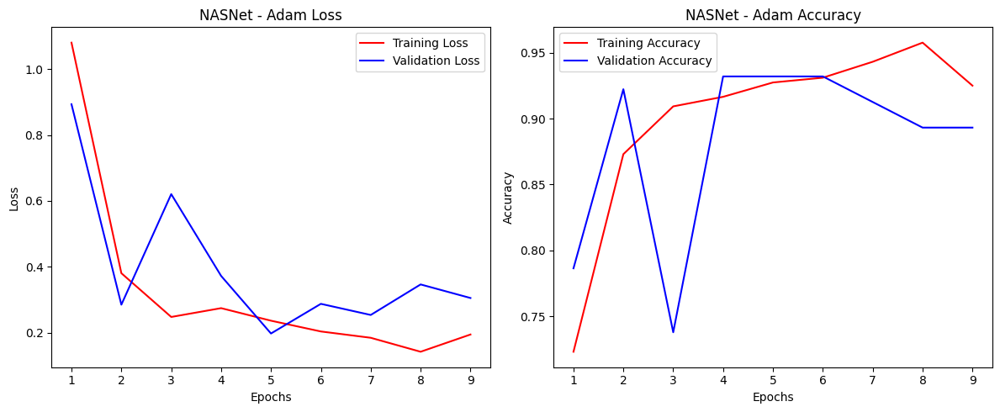

Test Loss: 0.1546, Test Accuracy: 0.9327
Displaying 5 sample predictions...


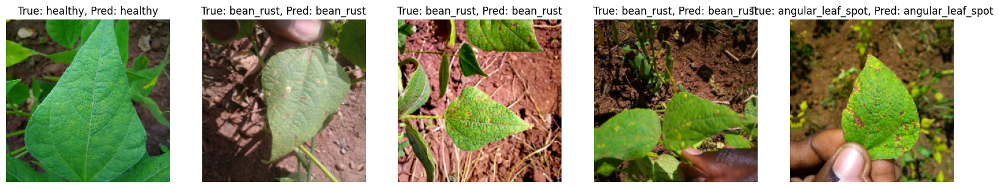


Training with Optimizer: RMSprop
Training EfficientNetB6...
Training EfficientNetB6 with Augmented Data using <class 'torch.optim.rmsprop.RMSprop'>...
Epoch 1/25, Train Loss: 0.5546, Train Accuracy: 0.8295, Val Loss: 41.5562, Val Accuracy: 0.7864
Epoch 2/25, Train Loss: 0.1668, Train Accuracy: 0.9420, Val Loss: 0.3959, Val Accuracy: 0.9223
Epoch 3/25, Train Loss: 0.1477, Train Accuracy: 0.9553, Val Loss: 0.1209, Val Accuracy: 0.9417
Epoch 4/25, Train Loss: 0.1014, Train Accuracy: 0.9674, Val Loss: 0.4228, Val Accuracy: 0.8932
Epoch 5/25, Train Loss: 0.1157, Train Accuracy: 0.9661, Val Loss: 0.9558, Val Accuracy: 0.8252
Epoch 6/25, Train Loss: 0.0837, Train Accuracy: 0.9770, Val Loss: 0.0903, Val Accuracy: 0.9515
Epoch 7/25, Train Loss: 0.0775, Train Accuracy: 0.9686, Val Loss: 0.2000, Val Accuracy: 0.9320
Epoch 8/25, Train Loss: 0.0276, Train Accuracy: 0.9879, Val Loss: 0.2112, Val Accuracy: 0.9515
Epoch 9/25, Train Loss: 0.0412, Train Accuracy: 0.9855, Val Loss: 4.6411, Val Accuracy:

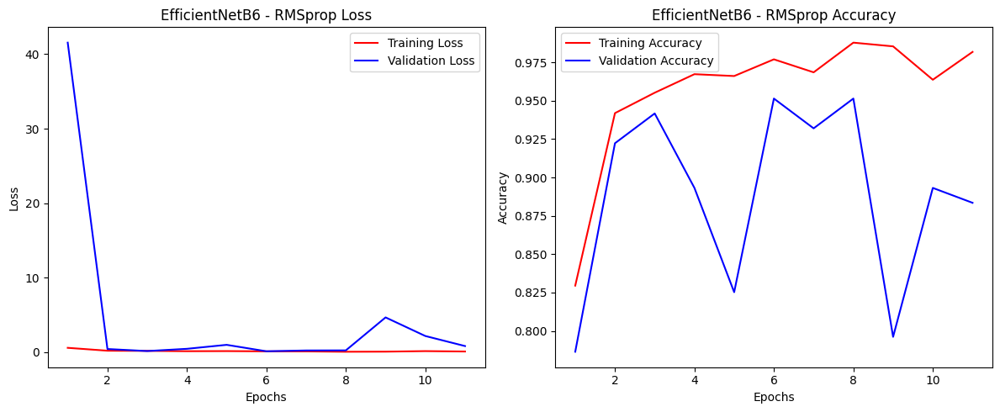

Test Loss: 0.4819, Test Accuracy: 0.8750
Displaying 5 sample predictions...


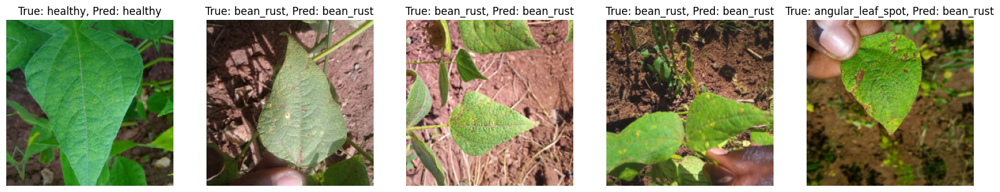

Training MobileNetV2...
Training MobileNetV2 with Augmented Data using <class 'torch.optim.rmsprop.RMSprop'>...
Epoch 1/25, Train Loss: 0.8642, Train Accuracy: 0.7279, Val Loss: 0.5619, Val Accuracy: 0.7476
Epoch 2/25, Train Loss: 0.2804, Train Accuracy: 0.9008, Val Loss: 0.2041, Val Accuracy: 0.9320
Epoch 3/25, Train Loss: 0.2824, Train Accuracy: 0.9033, Val Loss: 0.3778, Val Accuracy: 0.8641
Epoch 4/25, Train Loss: 0.2314, Train Accuracy: 0.9311, Val Loss: 0.1267, Val Accuracy: 0.9417
Epoch 5/25, Train Loss: 0.2315, Train Accuracy: 0.9299, Val Loss: 0.1660, Val Accuracy: 0.9417
Epoch 6/25, Train Loss: 0.2437, Train Accuracy: 0.9166, Val Loss: 0.2663, Val Accuracy: 0.9126
Epoch 7/25, Train Loss: 0.1654, Train Accuracy: 0.9492, Val Loss: 0.1867, Val Accuracy: 0.9417
Epoch 8/25, Train Loss: 0.1835, Train Accuracy: 0.9432, Val Loss: 0.2908, Val Accuracy: 0.9029
Epoch 9/25, Train Loss: 0.1428, Train Accuracy: 0.9468, Val Loss: 0.4329, Val Accuracy: 0.8738
Early stopping at epoch 9


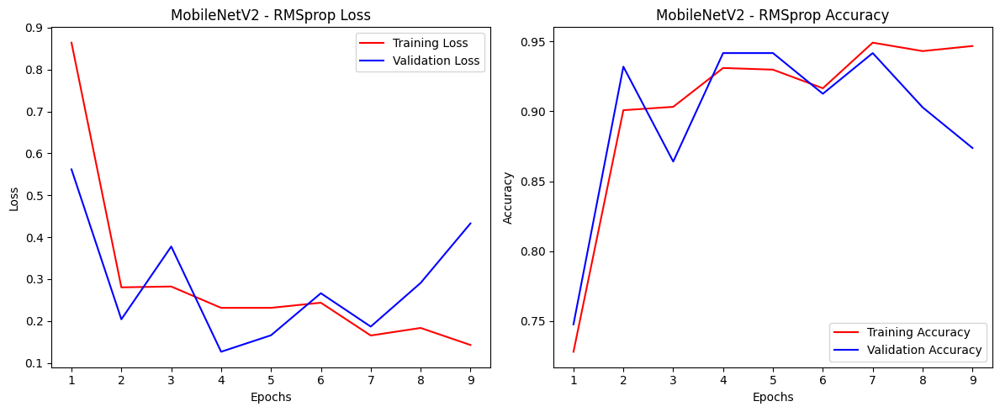

Test Loss: 0.3159, Test Accuracy: 0.9135
Displaying 5 sample predictions...


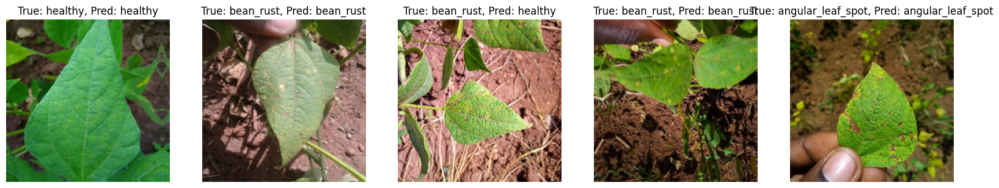

Training NASNet...
Training NASNet with Augmented Data using <class 'torch.optim.rmsprop.RMSprop'>...
Epoch 1/25, Train Loss: 1.5301, Train Accuracy: 0.4087, Val Loss: 1.1030, Val Accuracy: 0.4078
Epoch 2/25, Train Loss: 1.0914, Train Accuracy: 0.4353, Val Loss: 1.0159, Val Accuracy: 0.5340
Epoch 3/25, Train Loss: 1.0941, Train Accuracy: 0.4438, Val Loss: 1.2352, Val Accuracy: 0.4175
Epoch 4/25, Train Loss: 1.1080, Train Accuracy: 0.4015, Val Loss: 1.1969, Val Accuracy: 0.5146
Epoch 5/25, Train Loss: 1.0915, Train Accuracy: 0.4039, Val Loss: 1.1235, Val Accuracy: 0.4369
Epoch 6/25, Train Loss: 1.0579, Train Accuracy: 0.4172, Val Loss: 1.1141, Val Accuracy: 0.5340
Epoch 7/25, Train Loss: 1.0716, Train Accuracy: 0.4317, Val Loss: 0.9918, Val Accuracy: 0.4757
Early stopping at epoch 7


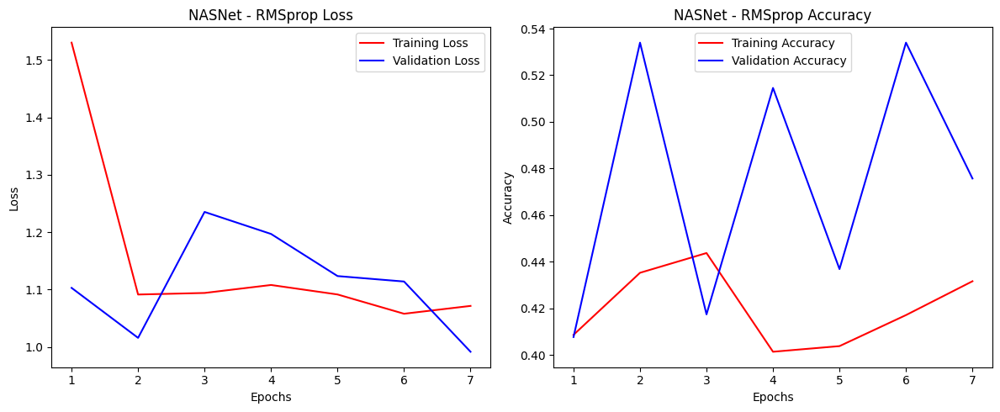

Test Loss: 1.0898, Test Accuracy: 0.4423
Displaying 5 sample predictions...


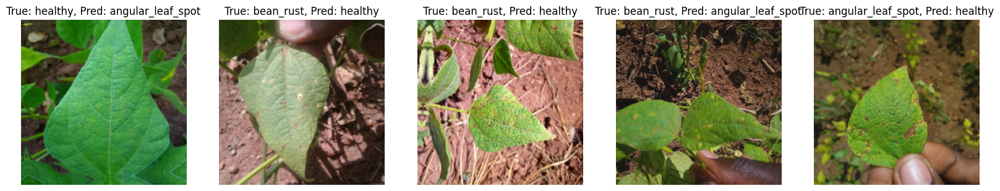


Training with Optimizer: Nadam
Training EfficientNetB6...
Training EfficientNetB6 with Augmented Data using <class 'torch.optim.nadam.NAdam'>...
Epoch 1/25, Train Loss: 0.0505, Train Accuracy: 0.9794, Val Loss: 0.2752, Val Accuracy: 0.9320
Epoch 2/25, Train Loss: 0.0911, Train Accuracy: 0.9746, Val Loss: 0.8862, Val Accuracy: 0.8155
Epoch 3/25, Train Loss: 0.0596, Train Accuracy: 0.9770, Val Loss: 1.3035, Val Accuracy: 0.8447
Epoch 4/25, Train Loss: 0.0470, Train Accuracy: 0.9843, Val Loss: 0.1825, Val Accuracy: 0.9417
Epoch 5/25, Train Loss: 0.0210, Train Accuracy: 0.9927, Val Loss: 0.2247, Val Accuracy: 0.9417
Epoch 6/25, Train Loss: 0.0484, Train Accuracy: 0.9794, Val Loss: 3.8002, Val Accuracy: 0.7961
Epoch 7/25, Train Loss: 0.0452, Train Accuracy: 0.9831, Val Loss: 0.4305, Val Accuracy: 0.9223
Epoch 8/25, Train Loss: 0.0453, Train Accuracy: 0.9807, Val Loss: 0.1616, Val Accuracy: 0.9806
Epoch 9/25, Train Loss: 0.0606, Train Accuracy: 0.9770, Val Loss: 0.1682, Val Accuracy: 0.9417

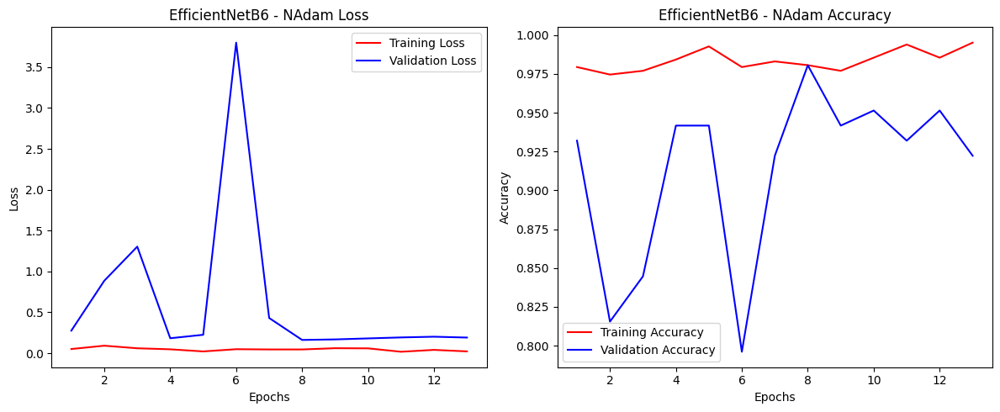

Test Loss: 0.1227, Test Accuracy: 0.9712
Displaying 5 sample predictions...


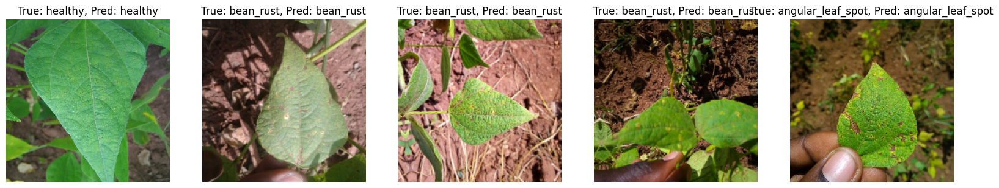

Training MobileNetV2...
Training MobileNetV2 with Augmented Data using <class 'torch.optim.nadam.NAdam'>...
Epoch 1/25, Train Loss: 0.1706, Train Accuracy: 0.9480, Val Loss: 0.1626, Val Accuracy: 0.9612
Epoch 2/25, Train Loss: 0.1109, Train Accuracy: 0.9637, Val Loss: 0.1434, Val Accuracy: 0.9612
Epoch 3/25, Train Loss: 0.1579, Train Accuracy: 0.9528, Val Loss: 0.1371, Val Accuracy: 0.9223
Epoch 4/25, Train Loss: 0.1045, Train Accuracy: 0.9589, Val Loss: 0.1629, Val Accuracy: 0.9515
Epoch 5/25, Train Loss: 0.1337, Train Accuracy: 0.9516, Val Loss: 0.1970, Val Accuracy: 0.9612
Epoch 6/25, Train Loss: 0.1162, Train Accuracy: 0.9637, Val Loss: 0.2558, Val Accuracy: 0.9223
Early stopping at epoch 6


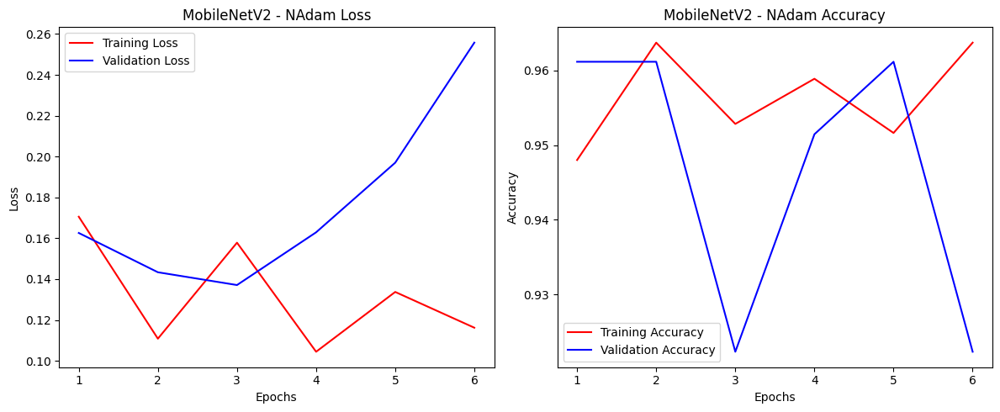

Test Loss: 0.2479, Test Accuracy: 0.9519
Displaying 5 sample predictions...


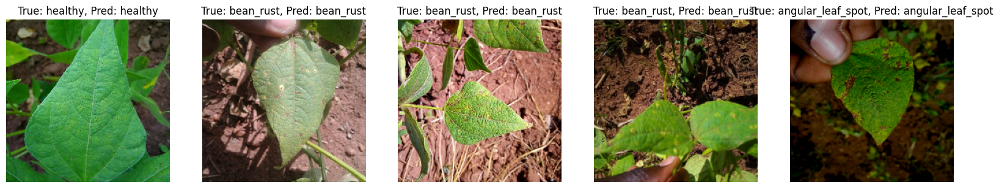

Training NASNet...
Training NASNet with Augmented Data using <class 'torch.optim.nadam.NAdam'>...
Epoch 1/25, Train Loss: 1.0251, Train Accuracy: 0.4619, Val Loss: 0.9876, Val Accuracy: 0.4854
Epoch 2/25, Train Loss: 0.9803, Train Accuracy: 0.5187, Val Loss: 0.9318, Val Accuracy: 0.6117
Epoch 3/25, Train Loss: 0.9043, Train Accuracy: 0.5852, Val Loss: 0.9056, Val Accuracy: 0.6602
Epoch 4/25, Train Loss: 0.8696, Train Accuracy: 0.5901, Val Loss: 0.8670, Val Accuracy: 0.6408
Epoch 5/25, Train Loss: 0.9251, Train Accuracy: 0.5526, Val Loss: 1.0980, Val Accuracy: 0.4369
Epoch 6/25, Train Loss: 0.8624, Train Accuracy: 0.6094, Val Loss: 1.1863, Val Accuracy: 0.4272
Epoch 7/25, Train Loss: 0.9902, Train Accuracy: 0.4970, Val Loss: 1.7601, Val Accuracy: 0.4175
Epoch 8/25, Train Loss: 1.0805, Train Accuracy: 0.3628, Val Loss: 1.0818, Val Accuracy: 0.3981
Early stopping at epoch 8


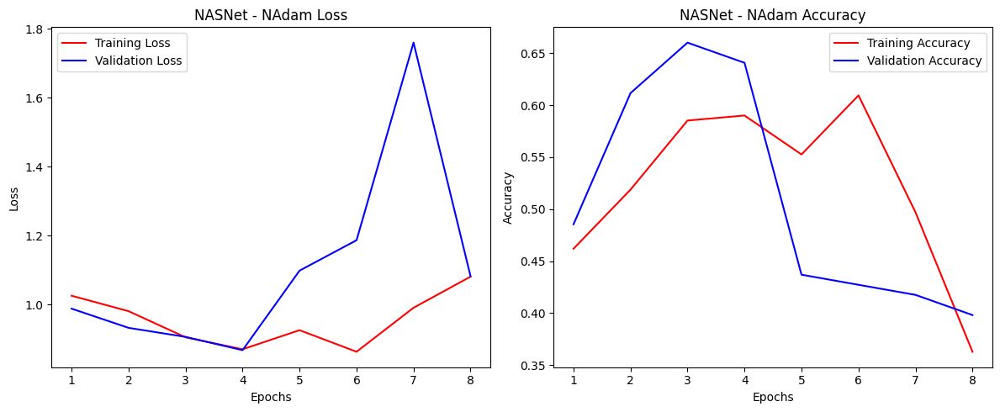

Test Loss: 1.0661, Test Accuracy: 0.4135
Displaying 5 sample predictions...


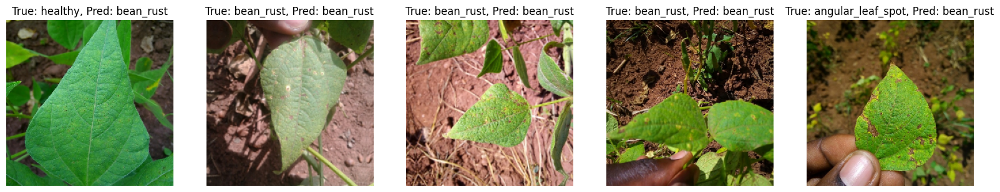

Training with different optimizers and evaluation completed!


In [15]:
# Train each model with each optimizer type for augmented data

for optimizer_type, optimizer_name in zip(optimizer_types, optimizer_names):

    torch.cuda.empty_cache()

    print(f"\nTraining with Optimizer: {optimizer_name}")

    for model_name in models_dict:

        torch.cuda.empty_cache()

        print(f"Training {model_name}...")

        model = models_dict[model_name]

        train_and_evaluate(model_name, model, optimizer_type, train_loader, val_loader, test_loader, criterion)



print("Training with different optimizers and evaluation completed!")

In [16]:
import torch



# Check if CUDA (GPU) is available

if torch.cuda.is_available():

    # Print GPU name

    print("GPU name:", torch.cuda.get_device_name(0))



    # Print GPU memory usage

    print("Memory Allocated:", round(torch.cuda.memory_allocated(0) / 1024**3, 2), "GB")

    print("Memory Cached:", round(torch.cuda.memory_reserved(0) / 1024**3, 2), "GB")

else:

    print("CUDA not available. Using CPU.")


GPU name: Tesla P100-PCIE-16GB
Memory Allocated: 1.03 GB
Memory Cached: 8.85 GB


In [19]:
torch.cuda.empty_cache()